**Principal Component Analysis and classification of Rice seed data**

Importing Libraries

In [115]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

Installing Pycaret

In [116]:
!pip install pycaret

**Dataset Description:**

The dataset utilized in this analysis pertains to Rice Seed Data, encompassing a diverse array of genetic varieties of rice. With its global significance as one of the most cultivated grain crops, rice exhibits a multitude of genetic differentiations. These differentiations, attributed to distinct features, enable the classification and assessment of seed quality. Comprising 12 attributes, this dataset correlates these distinguishing features with the classification of rice seeds. In this investigation, five specific rice varieties – Jasmine, Basmati, Ipsala, Karacadag, and Arborio – each consisting of 1336 randomly selected elements, were scrutinized. These elements were labeled with attributes such as area, perimeter, and aspect ratio, among others. Utilizing Artificial Neural Network (ANN) and Deep Neural Network (DNN) algorithms, models were developed for feature extraction and classification processes.

The dataset is applicable for tasks including the classification of rice varieties and cluster analysis, facilitating the evaluation of seed quality.

Attribute Information:

In the construction of the dataset, ten geometric parameters and attributes of rice seeds were meticulously measured:

- AREA
- PERIMETER
- MAJOR_AXIS
- MINOR_AXIS
- ECCENTRICITY
- EQDIASQ
- SOLIDITY
- CONVEX_AREA
- EXTENT
- ASPECT_RATIO
- ROUNDNESS
- CLASS

https://www.muratkoklu.com/datasets

https://doi.org/10.1016/j.compag.2021.106285

https://doi.org/10.15316/SJAFS.2021.252




Reading the Dataset File


In [117]:
# Reading the csv file from raw content
df = pd.read_csv('https://raw.githubusercontent.com/anshudabar/demopractice/master/seed4.csv')

# Displaying top 50 entries of the dataframe
df.head(50)


,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,CLASS
0,7805,437.915,209.8215,48.0221,0.9735,99.6877,0.9775,7985,0.3547,4.3693,0.5114,Basmati
1,7503,340.757,138.3361,69.8417,0.8632,97.7400,0.9660,7767,0.6637,1.9807,0.8120,Arborio
2,5124,314.617,141.9803,46.5784,0.9447,80.7718,0.9721,5271,0.4760,3.0482,0.6505,Jasmine
3,7990,437.085,201.4386,51.2245,0.9671,100.8622,0.9659,8272,0.6274,3.9325,0.5256,Basmati
4,7433,342.893,140.3350,68.3927,0.8732,97.2830,0.9831,7561,0.6006,2.0519,0.7944,Arborio
5,11648,445.527,178.4659,84.9327,0.8795,121.7813,0.9599,12135,0.5660,2.1013,0.7374,Ipsala
6,7621,450.325,219.0981,45.2301,0.9785,98.5056,0.9718,7842,0.3398,4.8441,0.4722,Basmati
7,8582,367.338,146.6128,75.5406,0.8570,104.5320,0.9740,8811,0.6423,1.9408,0.7992,Arborio
8,5450,320.362,139.9963,50.6910,0.9321,83.3016,0.9626,5662,0.5502,2.7618,0.6673,Jasmine
9,6781,307.023,116.2443,74.8093,0.7654,92.9184,0.9819,6906,0.7208,1.5539,0.9040,Karacadag


Generate pairwise relationship plot

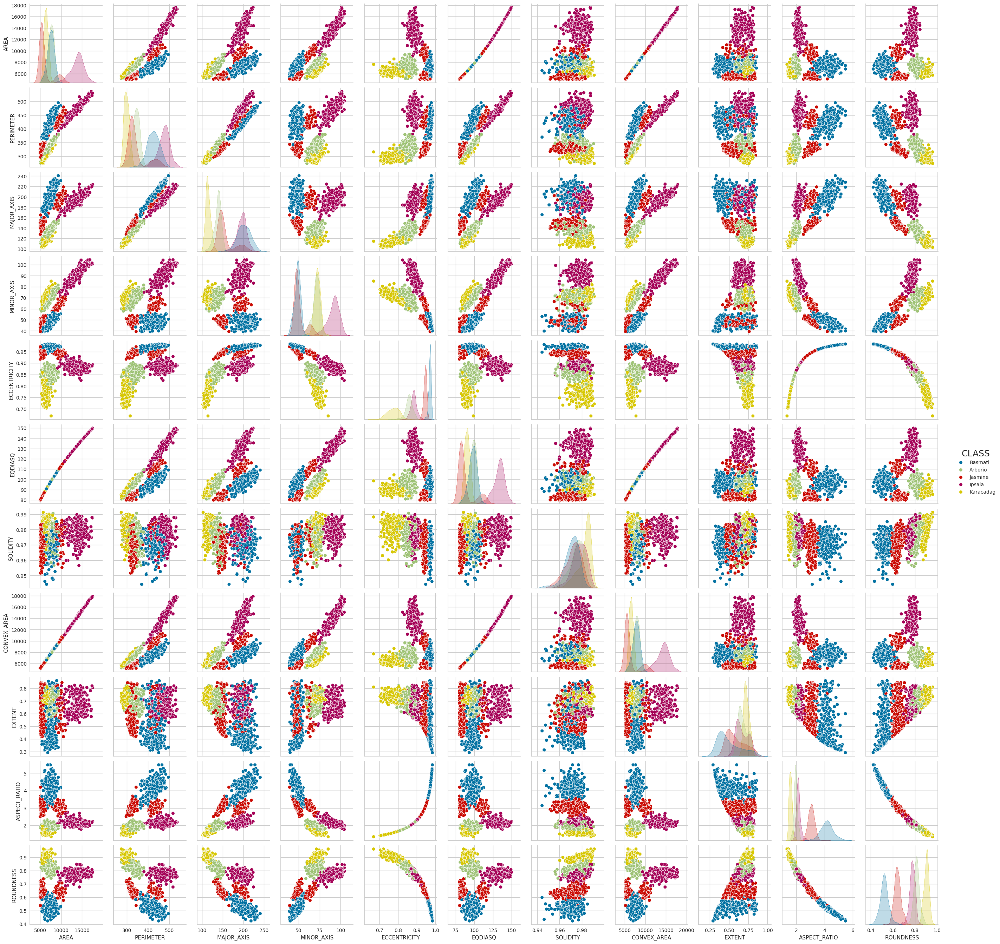

In [118]:
# Plot pairwise relationships in the DataFrame `df`, where each pair of variables is plotted against each other.
# The `hue` parameter is set to 'CLASS', which means that the data points will be color-coded based on the values in the 'CLASS' column.
sns.pairplot(df, hue='CLASS')

# Display the plot.
plt.show()

# **Data analysis**

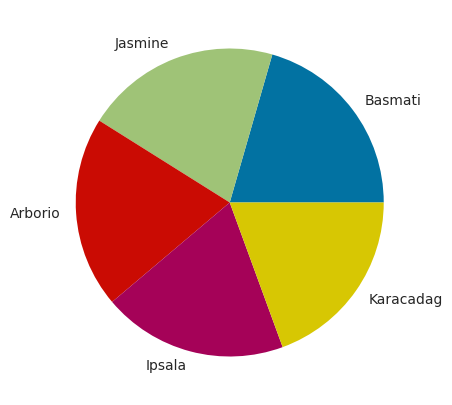

In [119]:
# Extract the target variable 'CLASS' from the DataFrame `df` and assign it to the variable `y`.
y = df['CLASS']

# Generate a pie chart representing the distribution of values in the target variable.
# The `value_counts()` method counts the occurrences of each unique value in `y`, and `plot(kind='pie')` creates a pie chart.
y.value_counts().plot(kind='pie')

# Remove the y-axis label from the plot to make it cleaner.
plt.ylabel('')

# Display the pie chart.
plt.show()

# **Data standardization**

In [120]:
# Extract features from the DataFrame `df` by dropping the 'CLASS' column and store them in the variable `X`.
X = df.drop(columns=['CLASS'])

# Display the first 10 rows of the feature DataFrame `X` for quick inspection.
X.head(10)

# Standardize the features in `X` using StandardScaler to scale them to have a mean of 0 and standard deviation of 1.
Xs = StandardScaler().fit_transform(X)

# Store the column names of the standardized features before converting to DataFrame.
Xcols = X.columns

# Convert the standardized features array `Xs` back to a DataFrame with original column names.
X = pd.DataFrame(Xs)

# Assign the original column names to the standardized DataFrame `X`.
X.columns = Xcols

# Display the first 10 rows of the standardized feature DataFrame `X` after standardization.
X.head(10)

# Generate summary statistics (mean, standard deviation, min, max, etc.) for each column in the standardized feature DataFrame `X`.
# Transpose the summary statistics for better readability.
X.describe().transpose()


,count,mean,std,min,25%,50%,75%,max
AREA,1334.0,2.916208e-16,1.000375,-1.075337,-0.701860,-0.310853,0.157324,3.055762
PERIMETER,1334.0,5.865706e-16,1.000375,-1.495475,-0.845591,-0.355554,0.921568,2.318002
MAJOR_AXIS,1334.0,3.568693e-16,1.000375,-1.652953,-0.755183,-0.331384,0.974845,2.220133
MINOR_AXIS,1334.0,-1.810978e-16,1.000375,-1.643286,-1.019570,0.160673,0.542404,2.295039
ECCENTRICITY,1334.0,7.243914e-16,1.000375,-3.064797,-0.538857,-0.007024,0.885206,1.344117
EQDIASQ,1334.0,5.772494e-16,1.000375,-1.217981,-0.726695,-0.259098,0.253191,2.765620
SOLIDITY,1334.0,-1.714770e-14,1.000375,-4.092487,-0.614866,0.045525,0.761218,2.010429
CONVEX_AREA,1334.0,1.557974e-16,1.000375,-1.075976,-0.715946,-0.322224,0.161667,2.998266
EXTENT,1334.0,-1.145178e-16,1.000375,-2.698327,-0.580159,0.196747,0.739847,1.814127
ASPECT_RATIO,1334.0,-4.234494e-16,1.000375,-1.307603,-0.741020,-0.458843,0.631765,2.975775


# Some plots

[Text(0, 0, 'AREA'),
 Text(1, 0, 'PERIMETER'),
 Text(2, 0, 'MAJOR_AXIS'),
 Text(3, 0, 'MINOR_AXIS'),
 Text(4, 0, 'ECCENTRICITY'),
 Text(5, 0, 'EQDIASQ'),
 Text(6, 0, 'SOLIDITY'),
 Text(7, 0, 'CONVEX_AREA'),
 Text(8, 0, 'EXTENT'),
 Text(9, 0, 'ASPECT_RATIO'),
 Text(10, 0, 'ROUNDNESS')]

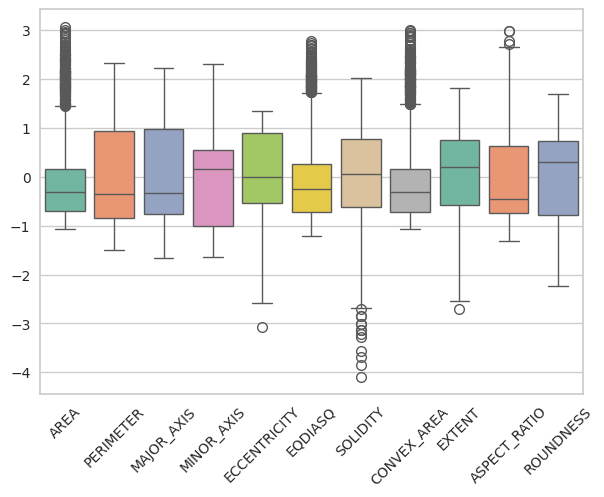

In [121]:
# Create a new figure for the boxplot visualization.
ax = plt.figure()

# Generate a boxplot of the features in DataFrame `X`, orienting the boxes vertically.
# The palette "Set2" is used to specify the color scheme.
ax = sns.boxplot(data=X, orient="v", palette="Set2")

# Rotate the x-axis tick labels by 45 degrees for better readability.
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


[Text(0, 0, 'AREA'),
 Text(1, 0, 'PERIMETER'),
 Text(2, 0, 'MAJOR_AXIS'),
 Text(3, 0, 'MINOR_AXIS'),
 Text(4, 0, 'ECCENTRICITY'),
 Text(5, 0, 'EQDIASQ'),
 Text(6, 0, 'SOLIDITY'),
 Text(7, 0, 'CONVEX_AREA'),
 Text(8, 0, 'EXTENT'),
 Text(9, 0, 'ASPECT_RATIO'),
 Text(10, 0, 'ROUNDNESS')]

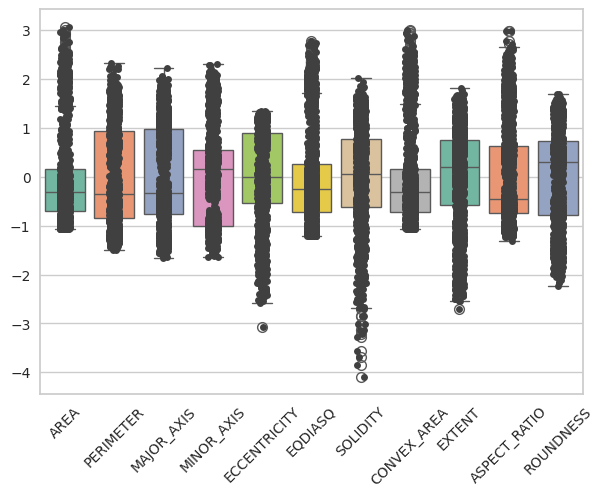

In [122]:
# Create a new figure for the combined boxplot and stripplot visualization.
ax = plt.figure()

# Generate a boxplot of the features in DataFrame `X`, orienting the boxes vertically, and using the palette "Set2".
ax = sns.boxplot(data=X, orient="v", palette="Set2")

# Overlay a stripplot of the features in DataFrame `X` to display individual data points.
# The color ".25" specifies the color of the stripplot.
ax = sns.stripplot(data=X, color=".25")

# Rotate the x-axis tick labels by 45 degrees for better readability.
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


## **Correlation matrix**

[Text(0.5, 1, 'AREA'),
 Text(1.5, 1, 'PERIMETER'),
 Text(2.5, 1, 'MAJOR_AXIS'),
 Text(3.5, 1, 'MINOR_AXIS'),
 Text(4.5, 1, 'ECCENTRICITY'),
 Text(5.5, 1, 'EQDIASQ'),
 Text(6.5, 1, 'SOLIDITY'),
 Text(7.5, 1, 'CONVEX_AREA'),
 Text(8.5, 1, 'EXTENT'),
 Text(9.5, 1, 'ASPECT_RATIO'),
 Text(10.5, 1, 'ROUNDNESS')]

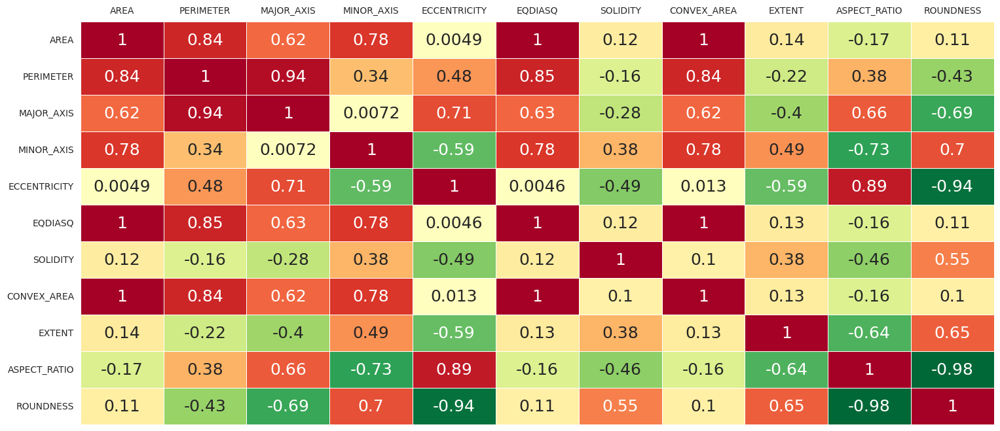

In [123]:
plt.figure(figsize=(18, 8))  # Adjust the width and height

# Generate the heatmap with appropriate settings
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False)

# Rotate the y-axis tick labels to horizontal orientation for better readability
plt.yticks(rotation=0)

# Show only the top x-axis tick labels to prevent overlapping
ax.tick_params(labelbottom=False, labeltop=True)

# Rotate the x-axis tick labels to horizontal orientation for better readability
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# **Principal Component Analysis**

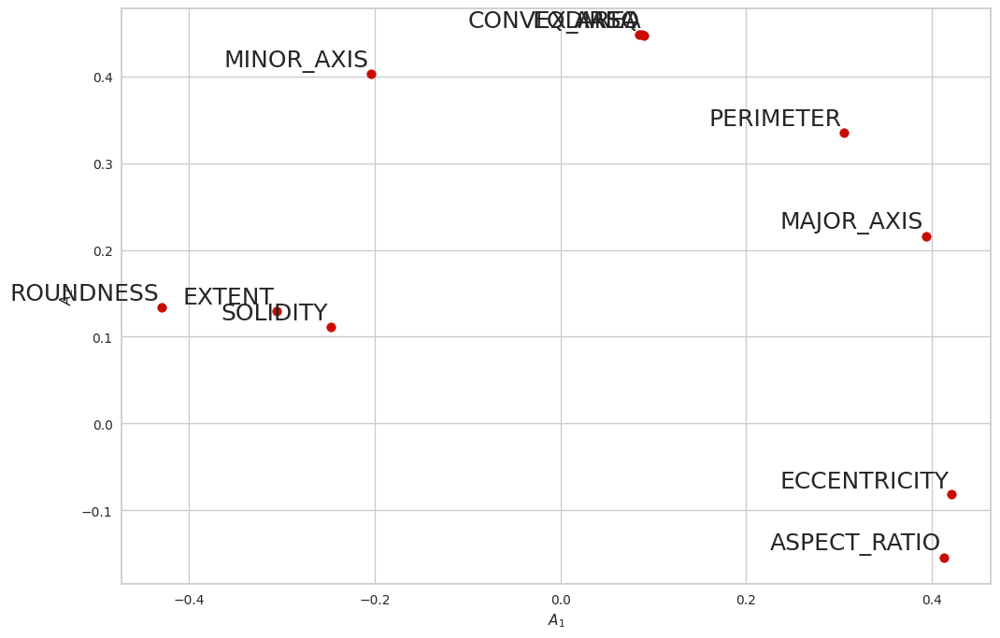

In [124]:
pca = PCA()
Z = pca.fit_transform(X)
A = pca.components_.T
variables = df.columns
plt. figure(figsize=(12,8))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

Eigen Vector

In [125]:
from sympy import Matrix, init_printing
init_printing()
display(Matrix(A))

⎡0.0852033192640801   0.447953197243467   0.0281885324937445   -0.032354222197
⎢                                                                             
⎢0.305430518936337    0.335210790107478   -0.0412521092523481  0.0411741408373
⎢                                                                             
⎢ 0.39358628401696    0.216026007150064    -0.12291282957038    0.104444555963
⎢                                                                             
⎢-0.20409984713912     0.4025832637627     0.125790925984996    -0.13667275108
⎢                                                                             
⎢0.421042067101057   -0.0818013190341918  -0.0826596021828805   0.197631630259
⎢                                                                             
⎢0.0879219479833402   0.448134976186696   0.0220980747770056   -0.028210014009
⎢                                                                             
⎢-0.247598847946246   0.111593745434684   -0.9555966

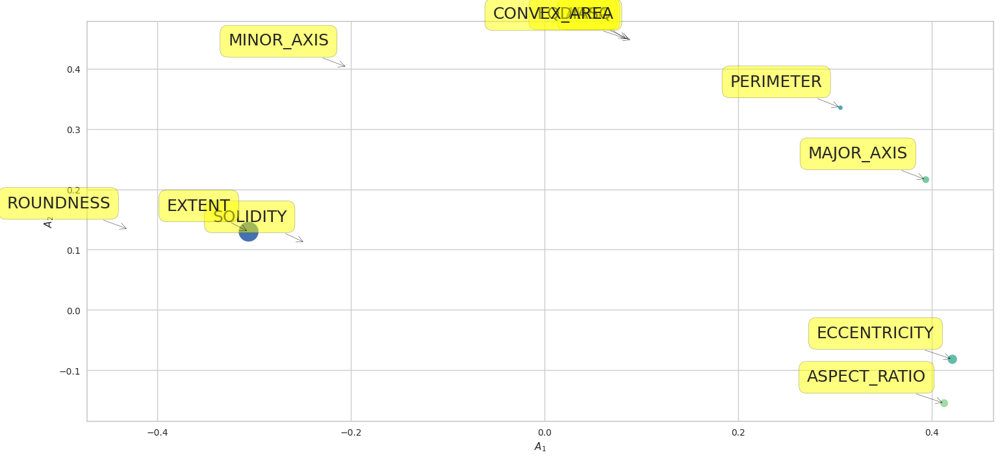

In [126]:
plt.figure(figsize=(18, 8))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->',color='black', connectionstyle='arc3,rad=0'))

**Scree Plot**

[4.84915647e+00 4.78765156e+00 7.03780066e-01 5.25469105e-01
 1.23878164e-01 9.52804001e-03 5.02312400e-03 3.31855925e-03
 3.13353707e-04 1.15513574e-04 1.81038108e-05]


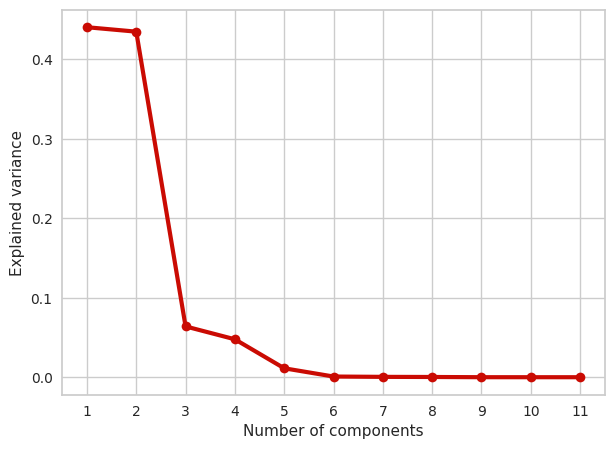

In [127]:
#Eigenvalues
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
print(Lambda)

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

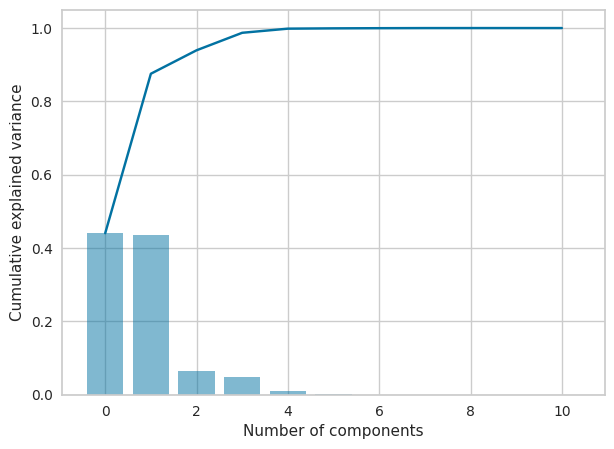

In [128]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

# **Using PCA Library**

In [129]:
!pip install pca

In [130]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

# PrincipaL Components
out['PC']

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [11] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [4] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [11] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[4]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


,PC1,PC2,PC3,PC4
0,3.559895,-0.891301,-1.252830,-1.004200
1,-0.943537,-0.438878,1.520467,-0.065564
2,0.745473,-2.775334,0.039325,-0.672564
3,2.886206,-0.566327,0.478634,0.927650
4,-1.157557,-0.359756,-0.692718,-0.532694
...,...,...,...,...
1329,0.850236,4.927011,0.156861,-0.707205
1330,0.556655,-1.785604,0.099368,2.086782
1331,-0.142055,4.219323,-1.130839,-0.512423
1332,2.377900,-1.645445,-0.938530,1.158249


**Scatter Plot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '4 Principal Components explain [99.83%] of the variance'}, xlabel='PC1 (44.0% expl.var)', ylabel='PC2 (43.4% expl.var)'>)

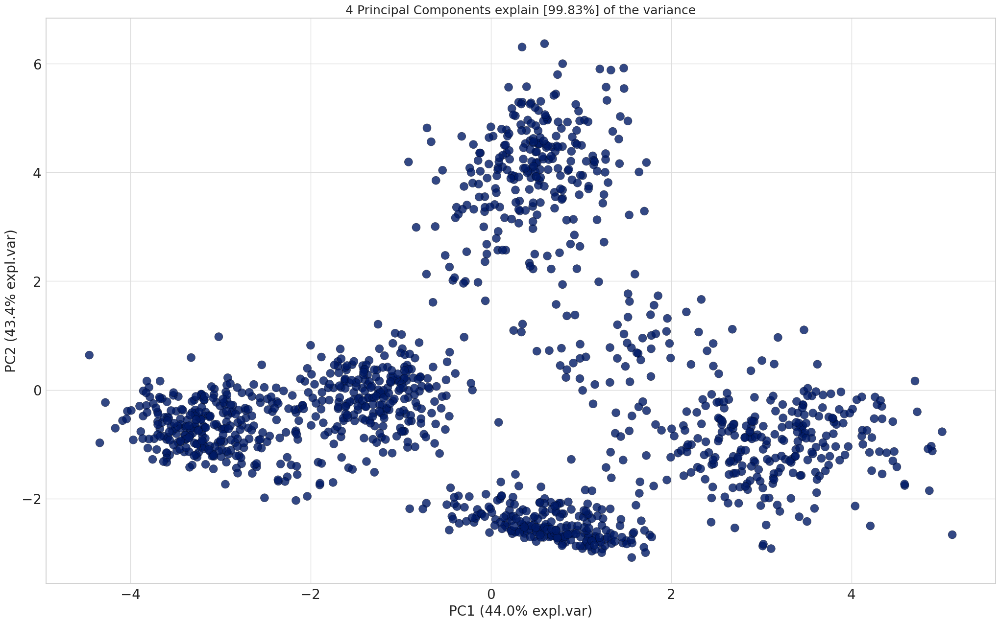

In [131]:
model.scatter(label=True, legend=False)

**Eigen Vectors**

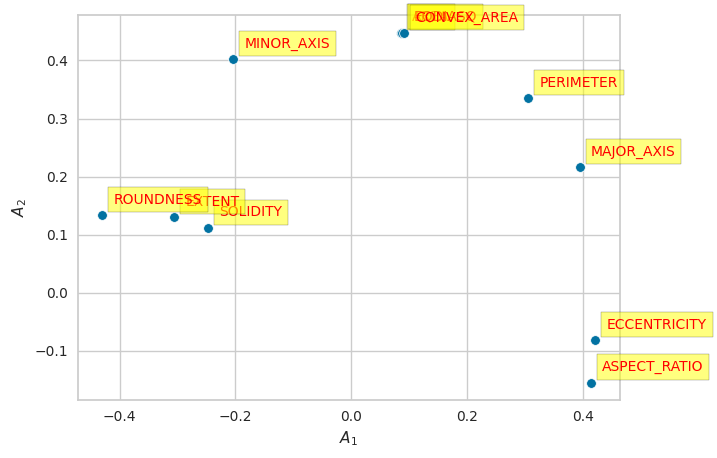

In [132]:
A = out['loadings'].T
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

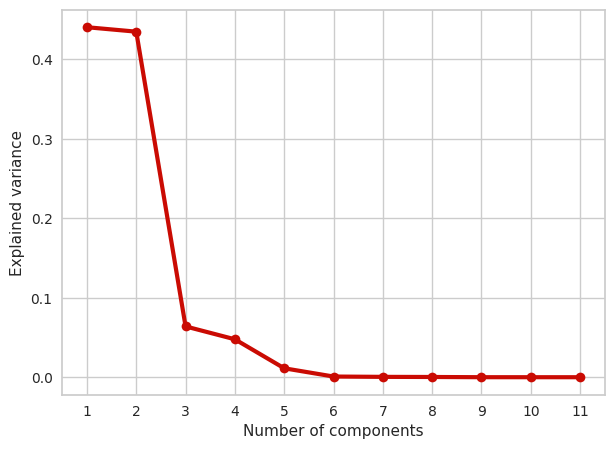

In [133]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

**Explained Variance Plot**

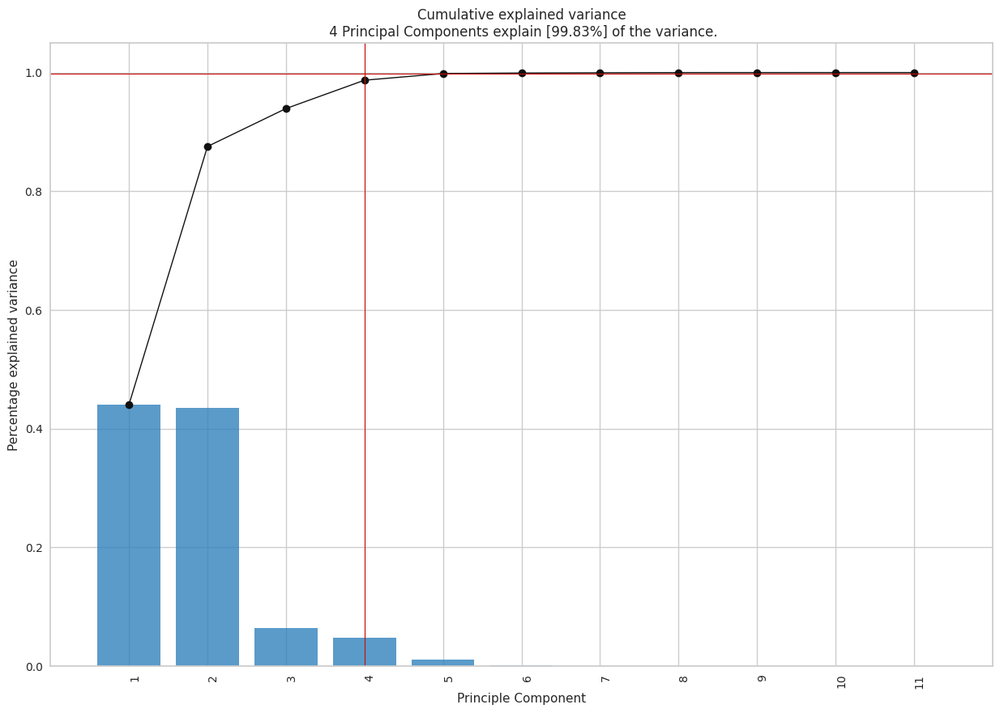

In [134]:
model.plot();

**Biplot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '4 Principal Components explain [99.83%] of the variance'}, xlabel='PC1 (44.0% expl.var)', ylabel='PC2 (43.4% expl.var)'>)

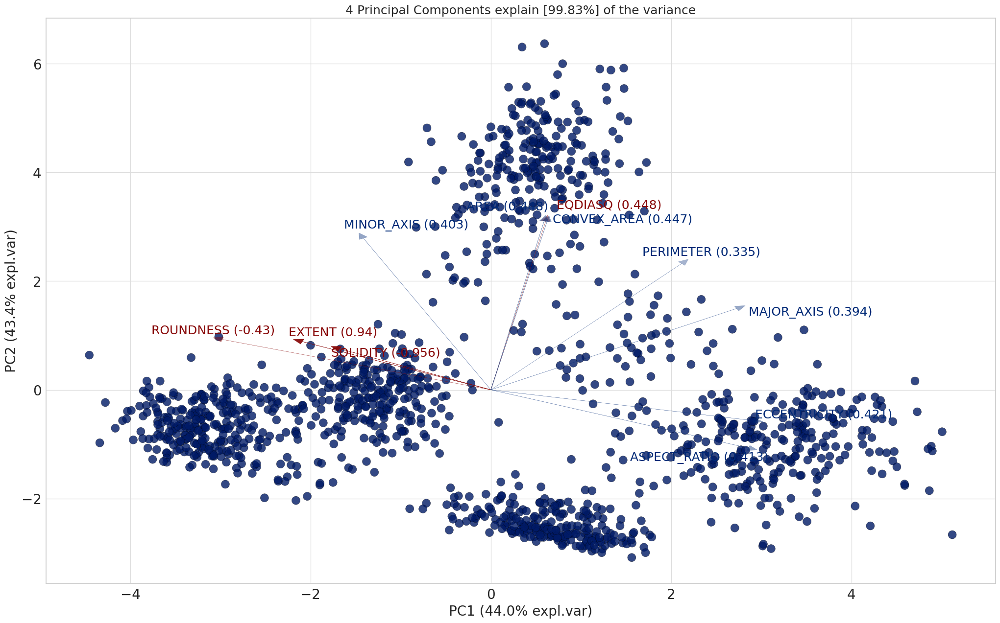

In [135]:
model.biplot(label=False, legend=False)

[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


(<Figure size 3000x2500 with 1 Axes>,
 <Axes3D: title={'center': '4 Principal Components explain [99.83%] of the variance'}, xlabel='PC1 (44.0% expl.var)', ylabel='PC2 (43.4% expl.var)', zlabel='PC3 (6.39% expl.var)'>)

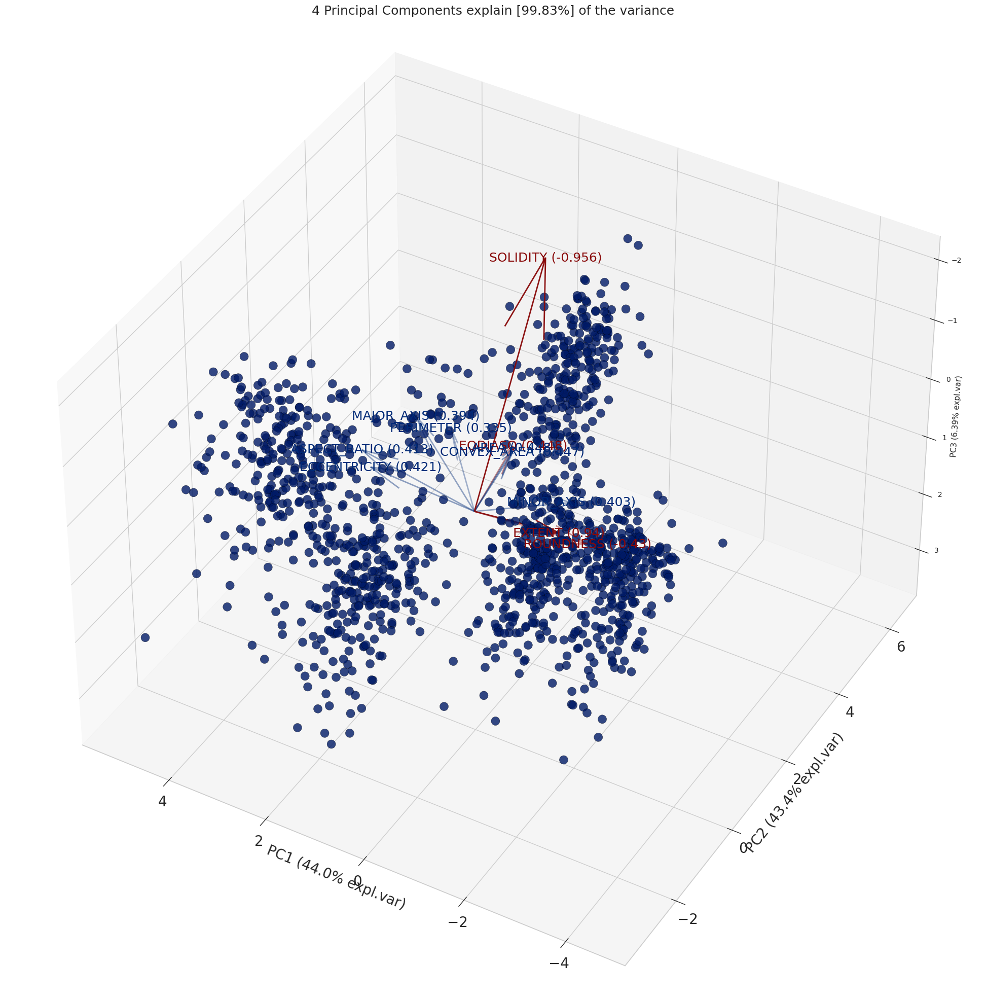

In [136]:
model.biplot3d(legend=False)

# **Classification Algorithms**

In [137]:
#Data for modelling
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (1201, 12)
Unseen Data For Predictions: (133, 12)


Environment Setup

In [138]:
from pycaret.classification import *
clf = setup(data=data, target='CLASS', train_size=0.7, session_id=123)

,Description,Value
0,Session id,123
1,Target,CLASS
2,Target type,Multiclass
3,Target mapping,"Arborio: 0, Basmati: 1, Ipsala: 2, Jasmine: 3, Karacadag: 4"
4,Original data shape,"(1201, 12)"
5,Transformed data shape,"(1201, 12)"
6,Transformed train set shape,"(840, 12)"
7,Transformed test set shape,"(361, 12)"
8,Numeric features,11
9,Preprocess,True


# Comparing differnt models

In [139]:
 best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9762,0.9992,0.9762,0.9780,0.9762,0.9702,0.9707,0.1940
gbc,Gradient Boosting Classifier,0.9750,0.0000,0.9750,0.9771,0.9750,0.9687,0.9693,2.2850
rf,Random Forest Classifier,0.9726,0.9985,0.9726,0.9747,0.9726,0.9658,0.9663,0.4880
qda,Quadratic Discriminant Analysis,0.9726,0.0000,0.9726,0.9746,0.9726,0.9657,0.9663,0.0980
lightgbm,Light Gradient Boosting Machine,0.9714,0.9970,0.9714,0.9733,0.9714,0.9643,0.9648,3.1690
xgboost,Extreme Gradient Boosting,0.9679,0.9969,0.9679,0.9703,0.9678,0.9598,0.9605,0.1660
lda,Linear Discriminant Analysis,0.9619,0.0000,0.9619,0.9652,0.9619,0.9523,0.9532,0.0410
dt,Decision Tree Classifier,0.9595,0.9748,0.9595,0.9618,0.9595,0.9494,0.9500,0.1550
lr,Logistic Regression,0.9583,0.0000,0.9583,0.9613,0.9582,0.9479,0.9487,1.8260
nb,Naive Bayes,0.9488,0.9972,0.9488,0.9523,0.9489,0.9360,0.9368,0.0950


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

Best model

In [140]:
best_model

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

For the remainder of this tutorial, we'll focus on the following models as our candidates. These selections are made for illustrative purposes and don't imply they are the best-performing or most suitable for this dataset:


*   Extra Trees Classifier('et')
*   K-Nearest Neighbor Classifier ('knn')
*   Quadratic Discriminant Analysis ('qda')
*   Naive Bayes ('nb')








Creating and Tuning the model


In [142]:
etc = create_model('et')
etc



,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9762,0.9995,0.9762,0.9775,0.9762,0.9702,0.9706
1,0.9881,0.9999,0.9881,0.9888,0.9881,0.9851,0.9853
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9643,0.9970,0.9643,0.9649,0.9643,0.9553,0.9555
4,0.9524,0.9993,0.9524,0.9581,0.9519,0.9404,0.9421
5,0.9881,1.0000,0.9881,0.9888,0.9881,0.9851,0.9853
6,0.9881,1.0000,0.9881,0.9888,0.9881,0.9851,0.9853
7,0.9643,0.9982,0.9643,0.9657,0.9643,0.9553,0.9557
8,0.9524,0.9986,0.9524,0.9585,0.9530,0.9405,0.9418


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

In [143]:
tuned_etc = tune_model(etc)
tuned_etc

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9643,0.9989,0.9643,0.9649,0.9643,0.9553,0.9555
1,0.9524,0.9982,0.9524,0.9549,0.9527,0.9404,0.9409
2,0.9881,1.0000,0.9881,0.9888,0.9881,0.9851,0.9853
3,0.9762,0.9964,0.9762,0.9776,0.9762,0.9702,0.9706
4,0.9524,0.9995,0.9524,0.9581,0.9519,0.9404,0.9421
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9881,0.9998,0.9881,0.9888,0.9881,0.9851,0.9853
7,0.9643,0.9981,0.9643,0.9675,0.9643,0.9554,0.9562
8,0.9524,0.9991,0.9524,0.9585,0.9530,0.9405,0.9418


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

Analyzing model performances

In [144]:
!pip install statsmodels --upgrade

In [145]:
evaluate_model(tuned_etc)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**K-Nearest Neighbour Classification**

In [146]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9524,0.9841,0.9524,0.9552,0.9531,0.9405,0.9408
1,0.8929,0.9690,0.8929,0.8941,0.8932,0.8659,0.8661
2,0.8929,0.9797,0.8929,0.9046,0.8929,0.8660,0.8693
3,0.8452,0.9544,0.8452,0.8458,0.8419,0.8067,0.8086
4,0.8214,0.9469,0.8214,0.8302,0.8209,0.7764,0.7789
5,0.8810,0.9692,0.8810,0.8923,0.8787,0.8512,0.8546
6,0.8452,0.9632,0.8452,0.8557,0.8455,0.8063,0.8086
7,0.9048,0.9773,0.9048,0.9173,0.9052,0.8811,0.8839
8,0.8810,0.9649,0.8810,0.8874,0.8818,0.8512,0.8524


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Evaluate the model after tuning

In [147]:
tuned_knn = tune_model(knn)
evaluate_model(tuned_knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9643,0.9919,0.9643,0.9658,0.9647,0.9553,0.9555
1,0.9167,0.9830,0.9167,0.9179,0.9170,0.8957,0.8959
2,0.9286,0.9831,0.9286,0.9300,0.9269,0.9107,0.9119
3,0.8333,0.9584,0.8333,0.8470,0.8285,0.7920,0.7969
4,0.8571,0.9576,0.8571,0.8668,0.8566,0.8211,0.8239
5,0.9167,0.9964,0.9167,0.9239,0.9155,0.8958,0.8979
6,0.8810,0.9691,0.8810,0.8827,0.8807,0.8510,0.8516
7,0.9048,0.9959,0.9048,0.9239,0.9043,0.8811,0.8860
8,0.8810,0.9789,0.8810,0.8958,0.8844,0.8514,0.8535


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Quadratic Discriminant Analysis**

In [148]:
qda = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9405,0.0000,0.9405,0.9429,0.9399,0.9255,0.9263
1,0.9762,0.0000,0.9762,0.9775,0.9761,0.9702,0.9705
2,0.9881,0.0000,0.9881,0.9888,0.9881,0.9851,0.9853
3,0.9643,0.0000,0.9643,0.9649,0.9643,0.9553,0.9555
4,0.9643,0.0000,0.9643,0.9694,0.9638,0.9553,0.9568
5,0.9881,0.0000,0.9881,0.9888,0.9881,0.9851,0.9853
6,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,0.9643,0.0000,0.9643,0.9675,0.9643,0.9554,0.9562
8,0.9405,0.0000,0.9405,0.9458,0.9410,0.9256,0.9267


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Evaluate Model after tuning

In [149]:
tuned_qda = tune_model(qda)
evaluate_model(tuned_qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9524,0.0000,0.9524,0.9562,0.9518,0.9404,0.9416
1,0.9643,0.0000,0.9643,0.9674,0.9645,0.9553,0.9560
2,0.9881,0.0000,0.9881,0.9888,0.9881,0.9851,0.9853
3,0.9762,0.0000,0.9762,0.9776,0.9762,0.9702,0.9706
4,0.9643,0.0000,0.9643,0.9694,0.9638,0.9553,0.9568
5,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9881,0.0000,0.9881,0.9888,0.9881,0.9851,0.9853
7,0.9643,0.0000,0.9643,0.9675,0.9643,0.9554,0.9562
8,0.9405,0.0000,0.9405,0.9458,0.9410,0.9256,0.9267


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Naive Bayes Classification**

In [150]:
nb = create_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9524,0.9970,0.9524,0.9530,0.9520,0.9404,0.9407
1,0.9286,0.9954,0.9286,0.9336,0.9293,0.9106,0.9114
2,0.9524,0.9977,0.9524,0.9619,0.9519,0.9405,0.9432
3,0.9286,0.9947,0.9286,0.9286,0.9286,0.9107,0.9107
4,0.9286,0.9950,0.9286,0.9295,0.9284,0.9106,0.9110
5,0.9643,0.9995,0.9643,0.9675,0.9646,0.9553,0.9560
6,0.9405,0.9972,0.9405,0.9471,0.9404,0.9256,0.9273
7,0.9643,0.9982,0.9643,0.9675,0.9643,0.9554,0.9562
8,0.9524,0.9993,0.9524,0.9585,0.9530,0.9405,0.9418


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Evaluate the model after tuning

In [151]:
tuned_nb = tune_model(nb)
evaluate_model(tuned_nb)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9524,0.9950,0.9524,0.9530,0.9520,0.9404,0.9407
1,0.9286,0.9942,0.9286,0.9336,0.9293,0.9106,0.9114
2,0.9524,0.9973,0.9524,0.9619,0.9519,0.9405,0.9432
3,0.9286,0.9934,0.9286,0.9286,0.9286,0.9107,0.9107
4,0.9286,0.9941,0.9286,0.9295,0.9284,0.9106,0.9110
5,0.9524,0.9993,0.9524,0.9549,0.9527,0.9404,0.9409
6,0.9167,0.9959,0.9167,0.9192,0.9163,0.8958,0.8966
7,0.9643,0.9981,0.9643,0.9675,0.9643,0.9554,0.9562
8,0.9405,0.9991,0.9405,0.9458,0.9410,0.9256,0.9267


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Tune Best Model**

In [152]:
tuned_best_model = tune_model(best_model)
tuned_best_model

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9643,0.9989,0.9643,0.9649,0.9643,0.9553,0.9555
1,0.9524,0.9982,0.9524,0.9549,0.9527,0.9404,0.9409
2,0.9881,1.0000,0.9881,0.9888,0.9881,0.9851,0.9853
3,0.9762,0.9964,0.9762,0.9776,0.9762,0.9702,0.9706
4,0.9524,0.9995,0.9524,0.9581,0.9519,0.9404,0.9421
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9881,0.9998,0.9881,0.9888,0.9881,0.9851,0.9853
7,0.9643,0.9981,0.9643,0.9675,0.9643,0.9554,0.9562
8,0.9524,0.9991,0.9524,0.9585,0.9530,0.9405,0.9418


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

# **Classification and PCA**

In [153]:
clf_pca = setup(data=data, target='CLASS', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,Session id,123
1,Target,CLASS
2,Target type,Multiclass
3,Target mapping,"Arborio: 0, Basmati: 1, Ipsala: 2, Jasmine: 3, Karacadag: 4"
4,Original data shape,"(1201, 12)"
5,Transformed data shape,"(1201, 4)"
6,Transformed train set shape,"(840, 4)"
7,Transformed test set shape,"(361, 4)"
8,Numeric features,11
9,Preprocess,True


**Comparing Models**

In [154]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9750,0.9975,0.9750,0.9767,0.9750,0.9687,0.9691,0.3570
xgboost,Extreme Gradient Boosting,0.9702,0.9974,0.9702,0.9720,0.9702,0.9628,0.9632,0.1460
et,Extra Trees Classifier,0.9679,0.9986,0.9679,0.9697,0.9677,0.9598,0.9603,0.2180
knn,K Neighbors Classifier,0.9655,0.9934,0.9655,0.9669,0.9654,0.9568,0.9572,0.1520
qda,Quadratic Discriminant Analysis,0.9655,0.0000,0.9655,0.9684,0.9655,0.9568,0.9576,0.0550
lightgbm,Light Gradient Boosting Machine,0.9643,0.9976,0.9643,0.9658,0.9642,0.9553,0.9557,1.6370
gbc,Gradient Boosting Classifier,0.9631,0.0000,0.9631,0.9644,0.9631,0.9539,0.9542,1.0330
dt,Decision Tree Classifier,0.9595,0.9748,0.9595,0.9620,0.9595,0.9494,0.9500,0.0810
lr,Logistic Regression,0.9583,0.0000,0.9583,0.9605,0.9583,0.9479,0.9484,0.1340
lda,Linear Discriminant Analysis,0.9571,0.0000,0.9571,0.9588,0.9572,0.9464,0.9468,0.0540


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

**Best Model PCA**

In [156]:
best_model_pca

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

**Tune and evaluate the best model**

In [157]:
tuned_best_model_pca = tune_model(best_model_pca)
tuned_best_model_pca
evaluate_model(tuned_best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9881,1.0000,0.9881,0.9888,0.9881,0.9851,0.9853
1,0.9524,0.9909,0.9524,0.9544,0.9524,0.9405,0.9410
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9643,0.9837,0.9643,0.9676,0.9643,0.9554,0.9562
4,0.9762,0.9920,0.9762,0.9775,0.9761,0.9702,0.9706
5,0.9524,0.9993,0.9524,0.9558,0.9524,0.9405,0.9413
6,0.9762,0.9915,0.9762,0.9790,0.9762,0.9702,0.9709
7,0.9643,0.9844,0.9643,0.9650,0.9643,0.9553,0.9555
8,0.9405,0.9807,0.9405,0.9435,0.9407,0.9255,0.9262


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [158]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9881,1.0000,0.9881,0.9888,0.9881,0.9851,0.9853
1,0.9881,0.9986,0.9881,0.9888,0.9881,0.9851,0.9853
2,0.9881,0.9996,0.9881,0.9888,0.9881,0.9851,0.9853
3,0.9643,0.9907,0.9643,0.9676,0.9643,0.9554,0.9562
4,0.9762,0.9987,0.9762,0.9775,0.9761,0.9702,0.9706
5,0.9643,1.0000,0.9643,0.9675,0.9642,0.9553,0.9562
6,0.9762,0.9990,0.9762,0.9790,0.9762,0.9702,0.9709
7,0.9762,0.9949,0.9762,0.9776,0.9762,0.9702,0.9706
8,0.9524,0.9937,0.9524,0.9549,0.9527,0.9404,0.9409


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune and evaluate Random Forest model**

In [165]:
tuned_rf_pca = tune_model(rf_pca)
tuned_rf_pca
evaluate_model(tuned_rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9881,1.0000,0.9881,0.9888,0.9881,0.9851,0.9853
1,0.9524,0.9909,0.9524,0.9544,0.9524,0.9405,0.9410
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9643,0.9837,0.9643,0.9676,0.9643,0.9554,0.9562
4,0.9762,0.9920,0.9762,0.9775,0.9761,0.9702,0.9706
5,0.9524,0.9993,0.9524,0.9558,0.9524,0.9405,0.9413
6,0.9762,0.9915,0.9762,0.9790,0.9762,0.9702,0.9709
7,0.9643,0.9844,0.9643,0.9650,0.9643,0.9553,0.9555
8,0.9405,0.9807,0.9405,0.9435,0.9407,0.9255,0.9262


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Extreme Gradient Boosting Model**

In [160]:
xgboost_pca = create_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9762,0.9998,0.9762,0.9775,0.9762,0.9702,0.9706
1,0.9762,0.9991,0.9762,0.9776,0.9762,0.9702,0.9706
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9643,0.9882,0.9643,0.9676,0.9643,0.9554,0.9562
4,0.9643,0.9991,0.9643,0.9663,0.9639,0.9553,0.9560
5,0.9762,0.9998,0.9762,0.9776,0.9762,0.9702,0.9706
6,0.9643,0.9982,0.9643,0.9677,0.9643,0.9554,0.9562
7,0.9524,0.9988,0.9524,0.9549,0.9523,0.9404,0.9411
8,0.9524,0.9933,0.9524,0.9549,0.9527,0.9404,0.9409


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune and evaluate**

In [161]:
tuned_xgboost_pca = tune_model(xgboost_pca)
tuned_xgboost_pca
evaluate_model(tuned_xgboost_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9881,1.0000,0.9881,0.9888,0.9881,0.9851,0.9853
1,0.9762,0.9989,0.9762,0.9762,0.9762,0.9702,0.9702
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9643,0.9898,0.9643,0.9676,0.9643,0.9554,0.9562
4,0.9762,0.9993,0.9762,0.9775,0.9761,0.9702,0.9706
5,0.9643,1.0000,0.9643,0.9675,0.9642,0.9553,0.9562
6,0.9762,0.9907,0.9762,0.9790,0.9762,0.9702,0.9709
7,0.9643,0.9993,0.9643,0.9675,0.9643,0.9554,0.9562
8,0.9524,0.9931,0.9524,0.9549,0.9527,0.9404,0.9409


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Extra Trees Classifier Model**

In [162]:
etc_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9881,1.0000,0.9881,0.9888,0.9881,0.9851,0.9853
1,0.9524,0.9991,0.9524,0.9531,0.9524,0.9404,0.9406
2,0.9881,1.0000,0.9881,0.9888,0.9881,0.9851,0.9853
3,0.9524,0.9941,0.9524,0.9537,0.9524,0.9405,0.9408
4,0.9405,0.9996,0.9405,0.9461,0.9394,0.9255,0.9273
5,0.9762,1.0000,0.9762,0.9787,0.9761,0.9702,0.9709
6,0.9762,0.9989,0.9762,0.9776,0.9762,0.9702,0.9706
7,0.9762,0.9975,0.9762,0.9776,0.9762,0.9702,0.9706
8,0.9524,0.9972,0.9524,0.9549,0.9527,0.9404,0.9409


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune and Evaluate**

In [164]:
tuned_etc_pca = tune_model(etc_pca)
tuned_etc_pca
evaluate_model(tuned_etc_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9881,1.0000,0.9881,0.9888,0.9881,0.9851,0.9853
1,0.9643,0.9991,0.9643,0.9649,0.9643,0.9553,0.9555
2,0.9881,1.0000,0.9881,0.9888,0.9881,0.9851,0.9853
3,0.9762,0.9938,0.9762,0.9776,0.9762,0.9702,0.9706
4,0.9524,0.9996,0.9524,0.9573,0.9521,0.9404,0.9417
5,0.9762,1.0000,0.9762,0.9787,0.9761,0.9702,0.9709
6,0.9524,0.9988,0.9524,0.9552,0.9524,0.9405,0.9411
7,0.9524,0.9988,0.9524,0.9585,0.9522,0.9405,0.9421
8,0.9524,0.9988,0.9524,0.9549,0.9527,0.9404,0.9409


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…